# Giga Recurrent Unbounded Network ➿

In [1]:
import torch
from torch.utils.data import DataLoader, Dataset, SequentialSampler, RandomSampler
import pandas as pd
import numpy as np
from sklearn.preprocessing import Normalizer, MinMaxScaler
import wandb
from IPython.display import Markdown

## Data Preprocessing & Loading

### Dataset Preprocessing

In [2]:
DAY_IN_MINUTES = 287

EXCLUDE_FEATURES = [
    "Failure", "Frequency", "Status", "Others",
    "Code", "name", "deviceid", "serial",
    "SB0", "Phase", "NV10P", "TotalEnergy_QuotControl", "TotalEnergyImported"
    #"INV01_TotalEnergy", "INV02_TotalEnergy", "INV03_TotalEnergy",
    #"cos",
    #"sin",
    "state", "SOL", "NA16", 
    #'soil_moisture_7_to_28cm (m³/m³)',
]
PATH = "merged_annuale_meteo.csv"

In [3]:
df = pd.read_csv(PATH, delimiter = ";")
df['timestamp'] = pd.to_datetime(df['timestamp'], yearfirst=True)
cols_to_remove = [column  for column in df.columns if len([elem for elem in EXCLUDE_FEATURES if elem in column]) > 0]
df = df.drop(columns=cols_to_remove)

# aggiunta encoding ciclico minuti, giorni
tmp_datetime_serie = pd.to_datetime(arg=df['timestamp'], yearfirst=True)

df["minute_sin"] = np.sin(2 * np.pi * tmp_datetime_serie.dt.minute / 60.0)
df["minute_cos"] = np.cos(2 * np.pi * tmp_datetime_serie.dt.minute / 60.0)

df["day_sin"] = np.sin(2 * np.pi * tmp_datetime_serie.dt.day / 31.0)
df["day_cos"] = np.cos(2 * np.pi * tmp_datetime_serie.dt.day / 31.0)

# trasformo la target series in Non Cumulativa
df['target'] = df['Cont_TotalEnergy(kWh)'].diff().fillna(0)

In [4]:
df = df.set_index(df['timestamp'])
df = df.drop(columns=['timestamp'])

In [5]:
train_df = df[((df.index >= '2022-06-01') * (df.index < '2023-01-01'))]
val_df = df[((df.index >= '2023-01-01') * (df.index < '2023-02-01'))]
test_df = df[((df.index >= '2023-02-01') * (df.index < '2023-03-01'))]

In [9]:
train_scaler = MinMaxScaler()
train_scaler.fit(train_df)

#tmp_data = train_scaler.transform(train_df)
train_df = pd.DataFrame(train_scaler.transform(train_df), columns=train_df.columns, index=train_df.index)
val_df = pd.DataFrame(train_scaler.transform(val_df), columns=val_df.columns, index=val_df.index)
test_df = pd.DataFrame(train_scaler.transform(test_df), columns=test_df.columns, index=test_df.index)

train_target_scaler = MinMaxScaler()
train_target_scaler.fit(train_df['target'].to_numpy().reshape(-1, 1))

MinMaxScaler()

In [10]:
display(Markdown("### Training Dataframe"))
display(train_df)

display(Markdown("### Validation Dataframe"))
display(val_df)

display(Markdown("### Testing Dataframe"))
display(test_df)

### Training Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:05:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.1,0.681373,0.241935,0.750000,0.933013,0.600779,0.989739,0.0
2022-06-01 00:10:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.1,0.681373,0.241935,0.933013,0.750000,0.600779,0.989739,0.0
2022-06-01 00:15:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.1,0.681373,0.241935,1.000000,0.500000,0.600779,0.989739,0.0
2022-06-01 00:20:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.1,0.681373,0.241935,0.933013,0.250000,0.600779,0.989739,0.0
2022-06-01 00:25:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.1,0.681373,0.241935,0.750000,0.066987,0.600779,0.989739,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 23:35:00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.0,0.102941,0.665323,0.250000,0.066987,0.500000,1.000000,0.0
2022-12-31 23:40:00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.0,0.102941,0.665323,0.066987,0.250000,0.500000,1.000000,0.0
2022-12-31 23:45:00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.0,0.102941,0.665323,0.000000,0.500000,0.500000,1.000000,0.0


### Validation Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:05:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.00,0.102941,0.665323,0.750000,0.933013,0.600779,0.989739,0.0
2023-01-01 00:10:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.00,0.102941,0.665323,0.933013,0.750000,0.600779,0.989739,0.0
2023-01-01 00:15:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.00,0.102941,0.665323,1.000000,0.500000,0.600779,0.989739,0.0
2023-01-01 00:20:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.00,0.102941,0.665323,0.933013,0.250000,0.600779,0.989739,0.0
2023-01-01 00:25:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.297414,0.0,0.00,0.102941,0.665323,0.750000,0.066987,0.600779,0.989739,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-31 23:35:00,0.0,0.0,1.077671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.250000,0.066987,0.500000,1.000000,0.0
2023-01-31 23:40:00,0.0,0.0,1.077671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.066987,0.250000,0.500000,1.000000,0.0
2023-01-31 23:45:00,0.0,0.0,1.077671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.000000,0.500000,0.500000,1.000000,0.0


### Testing Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-02-01 00:05:00,0.000000,0.000000,1.077671,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.750000,0.933013,0.600779,0.989739,0.0
2023-02-01 00:10:00,0.000000,0.000000,1.077671,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.933013,0.750000,0.600779,0.989739,0.0
2023-02-01 00:15:00,0.000000,0.000000,1.077671,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,1.000000,0.500000,0.600779,0.989739,0.0
2023-02-01 00:20:00,0.000000,0.000000,1.077671,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.933013,0.250000,0.600779,0.989739,0.0
2023-02-01 00:25:00,0.000000,0.000000,1.077671,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,...,-0.133621,0.0,0.44,-0.014706,0.935484,0.750000,0.066987,0.600779,0.989739,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28 23:35:00,0.305536,0.403033,1.190872,0.39942,0.405425,0.153484,0.417501,0.83682,0.965875,0.0,...,0.400862,0.0,1.00,0.122549,0.649194,0.250000,0.066987,0.213999,0.910151,0.0
2023-02-28 23:40:00,0.305536,0.403033,1.190872,0.39942,0.405425,0.153484,0.417501,0.83682,0.965875,0.0,...,0.400862,0.0,1.00,0.122549,0.649194,0.066987,0.250000,0.213999,0.910151,0.0
2023-02-28 23:45:00,0.305536,0.403033,1.190872,0.39942,0.405425,0.153484,0.417501,0.83682,0.965875,0.0,...,0.400862,0.0,1.00,0.122549,0.649194,0.000000,0.500000,0.213999,0.910151,0.0


### Dataset & DataLoader

In [11]:
BATCH_SIZE = 10

In [12]:
class CustomDataset(Dataset):
    MAX_DAYS = 4
    MIN_DAYS = 1

    def __init__(self, df, batch_size):
        self.df = df
        self.batch_size = batch_size
        self.counter = 0
        self.target_len = -1
    
    def __len__(self):
        return int(len(self.df)/287)-2 - self.MAX_DAYS
    
    def __getitem__(self, idx):
        if self.counter == self.batch_size:
            self.counter = 0
        
        if self.counter == 0:
            self.target_len = np.random.randint(1, self.MAX_DAYS+1)
        
        tmp_df = self.df.iloc[0+(287*(idx+1)) - 287 : (287*(idx+1))+(287*self.target_len) + 287]
        timestamps = tmp_df.index
        #tmp_df = tmp_df.drop(columns=['timestamp'])

        mask_before = np.array([1]*287 + [0]*(len(tmp_df) - 287))
        mask_after = np.array([0] * (len(tmp_df) - 287) + [1]*287)
        mask_target = np.array([0]*287 + [1] * (len(tmp_df) - 287*2) +[0] * 287)
        
        # print(len(mask_target), f"{timestamps[0]}-{timestamps[-1]}")
        
        before = tmp_df[mask_before == 1]
        target = tmp_df[mask_target == 1]
        after  = tmp_df[mask_after == 1]
        
        future = target.copy()
        future = future[[
            'Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)', 
            'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
            'temperature_2m (°C)', 'relativehumidity_2m (%)', 'dewpoint_2m (°C)', 
            'rain (mm)', 'cloudcover (%)', 'soil_temperature_7_to_28cm (°C)', 'soil_moisture_7_to_28cm (m³/m³)'
        ]]
        
        target = target['target']
        
        self.counter += 1
        
        #print(mask_before)
        #print(mask_target)
        #print(mask_after)
        
        return before, target, future, after, mask_before, mask_target, mask_after, timestamps
    
    def reset(self):
        self.counter = 0

In [13]:
def collate_fn(batch):
    # ha senso usare del padding ??
    before, target, future, after, masks_before, masks_target, masks_after, timestamps = zip(*batch)
    
    before = [torch.tensor(d.values, dtype=torch.float32) for d in before]
    before = torch.stack(before)
    
    target = [torch.tensor(d.values, dtype=torch.float32) for d in target]
    target = [torch.reshape(d, (d.shape[0], 1)) for d in target] # voglio shape [len_buco, 1]
    target = torch.stack(target)
    
    future = [torch.tensor(d.values, dtype=torch.float32) for d in future]
    future = torch.stack(future)
    
    after = [torch.tensor(d.values, dtype=torch.float32) for d in after]
    after = torch.stack(after)
    
    return before, target, future, after, masks_before, masks_target, masks_after, timestamps

### Tests

In [9]:
train_dataset = CustomDataset(train_df, BATCH_SIZE)

In [10]:
len(train_dataset)

208

In [12]:
b, t, f, a, mask_b, mask_t, mask_a, timestamps = train_dataset[0]

print(len(mask_b), len(mask_t), len(mask_a))

display(Markdown("### Before"))
display(b)
display(Markdown("### Target"))
display(t)
display(Markdown("### Future"))
display(f)
display(Markdown("### After"))
display(a)
display(Markdown("### Timestamps"))
display(timestamps)


1148 2022-06-01 00:05:00-2022-06-04 23:55:00
1148 1148 1148


### Before

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:05:00,0.0,0.0,145517.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.4,0.0,10.0,23.7,0.201,0.500000,8.660254e-01,0.201299,0.97953,0.0
2022-06-01 00:10:00,0.0,0.0,145517.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.4,0.0,10.0,23.7,0.201,0.866025,5.000000e-01,0.201299,0.97953,0.0
2022-06-01 00:15:00,0.0,0.0,145517.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.4,0.0,10.0,23.7,0.201,1.000000,2.832769e-16,0.201299,0.97953,0.0
2022-06-01 00:20:00,0.0,0.0,145517.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.4,0.0,10.0,23.7,0.201,0.866025,-5.000000e-01,0.201299,0.97953,0.0
2022-06-01 00:25:00,0.0,0.0,145517.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.4,0.0,10.0,23.7,0.201,0.500000,-8.660254e-01,0.201299,0.97953,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01 23:35:00,0.0,0.0,147319.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.8,0.0,0.0,23.3,0.198,-0.500000,-8.660254e-01,0.201299,0.97953,0.0
2022-06-01 23:40:00,0.0,0.0,147319.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.8,0.0,0.0,23.3,0.198,-0.866025,-5.000000e-01,0.201299,0.97953,0.0
2022-06-01 23:45:00,0.0,0.0,147319.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.8,0.0,0.0,23.3,0.198,-1.000000,-1.836970e-16,0.201299,0.97953,0.0


### Target

timestamp
2022-06-02 00:05:00    0.0
2022-06-02 00:10:00    0.0
2022-06-02 00:15:00    0.0
2022-06-02 00:20:00    0.0
2022-06-02 00:25:00    0.0
                      ... 
2022-06-03 23:35:00    0.0
2022-06-03 23:40:00    0.0
2022-06-03 23:45:00    0.0
2022-06-03 23:50:00    0.0
2022-06-03 23:55:00    0.0
Name: target, Length: 574, dtype: float64

### Future

,Impianto_SolargisGHI(W/m2),Impianto_SolargisGTI(W/m2),month_sin,month_cos,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,temperature_2m (°C),relativehumidity_2m (%),dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³)
timestamp,,,,,,,,,,,,,,,,,
2022-06-02 00:05:00,0.0,0.0,1.224647e-16,-1.0,0.000000,1.000000,0.500000,8.660254e-01,0.394356,0.918958,19.9,82.0,16.8,0.0,0.0,23.3,0.198
2022-06-02 00:10:00,0.0,0.0,1.224647e-16,-1.0,0.000000,1.000000,0.866025,5.000000e-01,0.394356,0.918958,19.9,82.0,16.8,0.0,0.0,23.3,0.198
2022-06-02 00:15:00,0.0,0.0,1.224647e-16,-1.0,0.000000,1.000000,1.000000,2.832769e-16,0.394356,0.918958,19.9,82.0,16.8,0.0,0.0,23.3,0.198
2022-06-02 00:20:00,0.0,0.0,1.224647e-16,-1.0,0.000000,1.000000,0.866025,-5.000000e-01,0.394356,0.918958,19.9,82.0,16.8,0.0,0.0,23.3,0.198
2022-06-02 00:25:00,0.0,0.0,1.224647e-16,-1.0,0.000000,1.000000,0.500000,-8.660254e-01,0.394356,0.918958,19.9,82.0,16.8,0.0,0.0,23.3,0.198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-03 23:35:00,0.0,0.0,1.224647e-16,-1.0,-0.258819,0.965926,-0.500000,-8.660254e-01,0.571268,0.820763,21.9,60.0,13.8,0.0,27.0,24.4,0.193
2022-06-03 23:40:00,0.0,0.0,1.224647e-16,-1.0,-0.258819,0.965926,-0.866025,-5.000000e-01,0.571268,0.820763,21.9,60.0,13.8,0.0,27.0,24.4,0.193
2022-06-03 23:45:00,0.0,0.0,1.224647e-16,-1.0,-0.258819,0.965926,-1.000000,-1.836970e-16,0.571268,0.820763,21.9,60.0,13.8,0.0,27.0,24.4,0.193


### After

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-04 00:05:00,0.0,0.0,150851.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.8,0.0,27.0,24.4,0.193,0.500000,8.660254e-01,0.724793,0.688967,0.0
2022-06-04 00:10:00,0.0,0.0,150851.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.8,0.0,27.0,24.4,0.193,0.866025,5.000000e-01,0.724793,0.688967,0.0
2022-06-04 00:15:00,0.0,0.0,150851.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.8,0.0,27.0,24.4,0.193,1.000000,2.832769e-16,0.724793,0.688967,0.0
2022-06-04 00:20:00,0.0,0.0,150851.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.8,0.0,27.0,24.4,0.193,0.866025,-5.000000e-01,0.724793,0.688967,0.0
2022-06-04 00:25:00,0.0,0.0,150851.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.8,0.0,27.0,24.4,0.193,0.500000,-8.660254e-01,0.724793,0.688967,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-04 23:35:00,0.0,0.0,152379.72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.1,0.0,0.0,24.7,0.190,-0.500000,-8.660254e-01,0.724793,0.688967,0.0
2022-06-04 23:40:00,0.0,0.0,152379.72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.1,0.0,0.0,24.7,0.190,-0.866025,-5.000000e-01,0.724793,0.688967,0.0
2022-06-04 23:45:00,0.0,0.0,152379.72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.1,0.0,0.0,24.7,0.190,-1.000000,-1.836970e-16,0.724793,0.688967,0.0


### Timestamps

timestamp
2022-06-01 00:05:00   2022-06-01 00:05:00
2022-06-01 00:10:00   2022-06-01 00:10:00
2022-06-01 00:15:00   2022-06-01 00:15:00
2022-06-01 00:20:00   2022-06-01 00:20:00
2022-06-01 00:25:00   2022-06-01 00:25:00
                              ...        
2022-06-04 23:35:00   2022-06-04 23:35:00
2022-06-04 23:40:00   2022-06-04 23:40:00
2022-06-04 23:45:00   2022-06-04 23:45:00
2022-06-04 23:50:00   2022-06-04 23:50:00
2022-06-04 23:55:00   2022-06-04 23:55:00
Name: timestamp, Length: 1148, dtype: datetime64[ns]

In [11]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [14]:
for b_before, b_target, b_future, b_after, b_m_b, b_m_t, b_m_a, b_timestamps in train_dataloader:
    print(b_before.shape, b_target.shape, b_future.shape, b_after.shape)
train_dataset.reset()

torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10

In [12]:
val_dataset = CustomDataset(val_df, BATCH_SIZE)

In [13]:
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [17]:
for b_vbefore, b_vtarget, b_vafter, b_vm_b, b_vm_t, b_vm_a, b_vtimestamps in val_dl:
    print(b_vbefore.shape, b_vtarget.shape, b_vafter.shape)
    print()
    #display(b_timestamps[0])

1148 2023-01-01 00:05:00-2023-01-04 23:55:00
1148 2023-01-09 00:05:00-2023-01-12 23:55:00
1148 2023-01-13 00:05:00-2023-01-16 23:55:00
1148 2023-01-22 00:05:00-2023-01-25 23:55:00
1148 2023-01-05 00:05:00-2023-01-08 23:55:00
1148 2023-01-03 00:05:00-2023-01-06 23:55:00
1148 2023-01-02 00:05:00-2023-01-05 23:55:00
1148 2023-01-25 00:05:00-2023-01-28 23:55:00
1148 2023-01-15 00:05:00-2023-01-18 23:55:00
1148 2023-01-24 00:05:00-2023-01-27 23:55:00
torch.Size([10, 287, 47]) torch.Size([10, 574, 47]) torch.Size([10, 287, 47])

1722 2023-01-14 00:05:00-2023-01-19 23:55:00
1722 2023-01-08 00:05:00-2023-01-13 23:55:00
1722 2023-01-16 00:05:00-2023-01-21 23:55:00
1722 2023-01-23 00:05:00-2023-01-28 23:55:00
1722 2023-01-11 00:05:00-2023-01-16 23:55:00
1722 2023-01-07 00:05:00-2023-01-12 23:55:00
1722 2023-01-20 00:05:00-2023-01-25 23:55:00
1722 2023-01-04 00:05:00-2023-01-09 23:55:00
1722 2023-01-12 00:05:00-2023-01-17 23:55:00
1722 2023-01-06 00:05:00-2023-01-11 23:55:00
torch.Size([10, 287, 

## Model Settings

In [14]:
import torch.nn.functional as F
from torch import nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchview import draw_graph
import graphviz

graphviz.set_jupyter_format('png')

'svg'

In [15]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
#device = "cpu"
print(f"Using {device} device")

Using cuda device


In [16]:
class EarlyStopper:
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = np.inf

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False
    
    def __str__(self):
        return f"EarlyStopper(patience: {self.patience}, min_delta={self.min_delta})"
    

In [17]:
run = wandb.init(
    project="interpolation",
    name="Giga Recurrent Random Unbounded Network ➿",
    config={
        "learning_rate": 0.001,
        "architecture": "GRRUN",
        "dataset": "RofiloAnnuale-FullCyclingEncoding",
        "epochs": 100,
        "batch_size": BATCH_SIZE, #10
        "window_size": 1,
        "target_size": 1,
    }
)

wandb: Currently logged in as: nicolo-vescera (rofilopd). Use `wandb login --relogin` to force relogin


### Model Architecture

In [18]:
class NeuralNetwork(nn.Module):
    # TODO: passare questi dati come parametri al costruttore
    GRU_OUT_SIZE = 32
    BATCH_SIZE = run.config['batch_size']
    FEATURES_SIZE = 47
    DECODER_INPUT_SIZE = 128
    FUTURE_SIZE = 17
    
    def __init__(self):
        super().__init__()
        # ENCODER        
        self.input_before = nn.GRU(
            input_size=self.FEATURES_SIZE, 
            hidden_size=self.GRU_OUT_SIZE, 
            num_layers=1, 
            batch_first=True
        )# fare prove. usare multipli di 2 forse meglio ??
        self.input_after = nn.GRU(
            input_size=self.FEATURES_SIZE,
            hidden_size=self.GRU_OUT_SIZE,
            num_layers=1,
            batch_first=True
        )
        
        #FCL 
        self.flat = nn.Flatten()
        
        self.linear1_2 = nn.Linear(self.GRU_OUT_SIZE * 2, self.DECODER_INPUT_SIZE)
        self.linear2_2 = nn.Linear(self.DECODER_INPUT_SIZE, self.DECODER_INPUT_SIZE)
        
        # DECODER
        self.loopGru = nn.GRU(
            input_size=self.FUTURE_SIZE, 
            hidden_size=self.DECODER_INPUT_SIZE, 
            num_layers=1, 
            batch_first=True
        )
        
        # porta a [len_buco, 1] l'output della gru
        self.output = nn.Linear(self.DECODER_INPUT_SIZE, 1)

    def encoder(self, before, after):
        before_out, before_h = self.input_before(before)
        after_out, after_h = self.input_after(after)
              
        # prendere l'ultima predizione della GRU x
        before_out = before_out[:, -1:]
        after_out  = after_out[:, -1:]

        #before_h   = before_h[:, -1:]
        #after_h    = after_h[:, -1:]
        
        # combina le features
        x = torch.cat((before_out, after_out), -1)
        # hidden_state = torch.cat((before_h, after_h), -1)
        
        return x, None
    
    def middle_layer(self, x):
        x = F.relu(self.linear1_2(x))
        x = F.relu(self.linear2_2(x))
        
        return x
    
    def decoder(self, future_input, hidden_state):
        # effettuo uno swap tra la batch_size e la dimensione del buco
        # per rispettare l'input dell'hidden state
        hidden_state = hidden_state.permute(1, 0, 2)
        
        x, hidden = self.loopGru(future_input, hidden_state)
        
        return x
    
    def test(self, before, after, future_input):        
        x, hidden_state = self.encoder(before, after)
        print("Out Encoder: ", x.shape)
        
        x = self.middle_layer(x)
        print("Out Middle: ", x.shape)
        
        x = self.decoder(future_input, x)
        print("Out Decoder: ", x.shape)
        
        x = self.output(x)
        print("Output: ", x.shape)
        
        return x

    def forward(self, before, after, future_input):        
        x, _ = self.encoder(before, after)        
        x    = self.middle_layer(x)        
        x    = self.decoder(future_input, x)        
        x    = self.output(x)

        return x


In [19]:
model = NeuralNetwork().to(device)
# optimizer = torch.optim.SGD(model.parameters(), lr=run.config['learning_rate'])
optimizer = torch.optim.Adam(model.parameters(), lr=run.config['learning_rate'])

print(model)
print(optimizer)

run.config['optimizer'] = optimizer

NeuralNetwork(
  (input_before): GRU(47, 32, batch_first=True)
  (input_after): GRU(47, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(17, 128, batch_first=True)
  (output): Linear(in_features=128, out_features=1, bias=True)
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)


In [20]:
model_graph = draw_graph(model, input_size=[(5, 287, 47), (5, 287, 47), (5, 287, 17)], save_graph=True, expand_nested=True, device=device)
model_graph.visual_graph
run.log({"Model Shape": wandb.Image("model.gv.png")})

In [26]:
batch_idx, (before, target, future, after, m_b, m_t, m_a, timestamp) = next(enumerate(train_dataloader))
before, target, future, after= before.to(device), target.to(device), future.to(device), after.to(device)

train_probs = model.test(before, after, future)

Out Encoder:  torch.Size([10, 1, 64])
Out Middle:  torch.Size([10, 1, 128])
Out Decoder:  torch.Size([10, 287, 128])
Output:  torch.Size([10, 287, 1])


## Training

  0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 01/100 | Train Loss 0.035 | Val Loss 0.037
	Saving model (improve loss) 1000000.0 -> 0.0374075248837471
Epoch 02/100 | Train Loss 0.041 | Val Loss 0.035
	Saving model (improve loss) 0.0374075248837471 -> 0.03482571244239807
Epoch 03/100 | Train Loss 0.037 | Val Loss 0.034
	Saving model (improve loss) 0.03482571244239807 -> 0.033656805753707886
Epoch 04/100 | Train Loss 0.035 | Val Loss 0.032
	Saving model (improve loss) 0.033656805753707886 -> 0.031935520470142365
Epoch 05/100 | Train Loss 0.042 | Val Loss 0.034
Epoch 06/100 | Train Loss 0.042 | Val Loss 0.034
Epoch 07/100 | Train Loss 0.036 | Val Loss 0.032
	Saving model (improve loss) 0.031935520470142365 -> 0.03185673803091049
Epoch 08/100 | Train Loss 0.048 | Val Loss 0.034
Epoch 09/100 | Train Loss 0.042 | Val Loss 0.035
Epoch 10/100 | Train Loss 0.044 | Val Loss 0.033
Epoch 11/100 | Train Loss 0.035 | Val Loss 0.033
Epoch 12/100 | Train Loss 0.038 | Val Loss 0.034
Epoch 13/100 | Train Loss 0.047 | Val Loss 0.033
Epoch 14/10

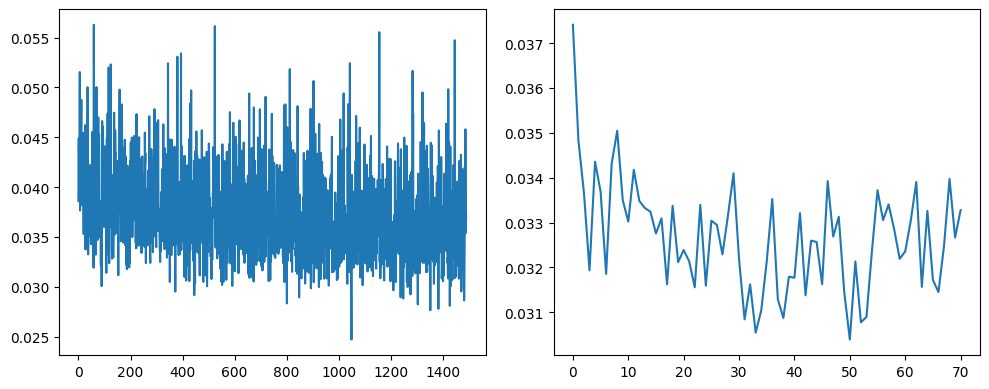

In [19]:
# definizione datasets e dataloaders
# vengono istanziati ogni volta che la run ha inizio così da gestire meglio ed impedire
# errori sul calcolo dei batch
train_dataset = CustomDataset(train_df, BATCH_SIZE)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)
val_dataset = CustomDataset(val_df, BATCH_SIZE)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

t_loss_list, v_loss_list = [], []
loop = tqdm(range(run.config['epochs']), unit="epoch")
early_stopping = EarlyStopper(patience=20)
best_vloss = 1_000_000.
loss = nn.L1Loss()

run.config['early_stopping'] = str(early_stopping)
run.config['save_best'] = True
run.watch(model)

for epoch in loop:
    model.train()
    for batch_idx, (before, target, future, after, m_b, b_t, m_a, timestamps) in enumerate(train_dataloader):        
        target, before, after, future = target.to(device), before.to(device), after.to(device), future.to(device)
        
        train_pred = model(before, after, future)
        
        # TODO: riguardare sum()
        # controllare opzione su sum ridurre per righe o colonne
        train_loss = loss((train_pred/train_pred.sum(dim=(1,2), keepdim=True)) * target.sum(dim=(1,2), keepdim=True), target) # TODO: che dim usare ?
        #train_loss = loss((train_pred/train_pred.sum()) * target.sum(), target)
        #train_loss = loss(train_pred, target)
        
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()
        
        t_loss_list.append(train_loss.item())
    
    model.eval()
    running_vloss = 0.0
    
    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        for i, (vbefore, vtarget, vfuture, vafter, vm_b, vm_t, vm_a, vtimestamp) in enumerate(val_dataloader):
            vbefore, vtarget, vfuture, vafter = vbefore.to(device), vtarget.to(device), vfuture.to(device), vafter.to(device)
            voutputs = model(vbefore, vafter, vfuture)
            vloss = loss((voutputs/voutputs.sum(dim=(1,2), keepdim=True)) * vtarget.sum(dim=(1,2), keepdim=True), vtarget) 
            #vloss = loss((voutputs/voutputs.sum()) * vtarget.sum(), vtarget) 
            running_vloss += vloss

    # resetting dataset generation
    # TODO: fix con DROP LAST
    train_dataset.reset()
    val_dataset.reset()
    
    avg_vloss = running_vloss / (i + 1) # TODO: ricontrollare
    v_loss_list.append(avg_vloss.item())
    
    loop.set_description(f"Epoch [{epoch}/{run.config['epochs']}]")
    loop.set_postfix(loss=t_loss_list[-1], val_loss=v_loss_list[-1])
    
    run.log({"loss": t_loss_list[-1], "val_loss": v_loss_list[-1]})
    
    print(
            f"Epoch {epoch+1:02d}/{run.config['epochs']:02d}"
            f" | Train Loss {t_loss_list[-1]:.3f}"
            f" | Val Loss {v_loss_list[-1]:.3f}"
        )
    
    # save model when improves loss
    if avg_vloss < best_vloss:
        print(f"\tSaving model (improve loss) {best_vloss} -> {avg_vloss}")
        best_vloss = avg_vloss
        model_path = f"GRRUN_b{run.config['batch_size']}_e{run.config['epochs']}.model"
        torch.save(model.state_dict(), model_path)

    # check for early stopping
    if early_stopping.early_stop(v_loss_list[-1]):
        print(f"\tEarly Stopping @ epoch {epoch} loss: {t_loss_list[-1]} val_loss: {v_loss_list[-1]}")
        break

# plot training/validation loss
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
axes[0].plot(t_loss_list)
axes[1].plot(v_loss_list)
fig.tight_layout()

## Evaluation

In [21]:
import plotly.express as px
from torchmetrics.regression import MeanAbsolutePercentageError, SymmetricMeanAbsolutePercentageError, MeanAbsoluteError, R2Score

In [22]:
def MeanImputationError(target, preds):
    return (abs(target-preds)).sum() / target.shape[1]

def NormalizedRootMeanSquareError(target, preds):
    def RootMeanSquareError():
        return np.sqrt((1/target.shape[1]) * torch.pow((target-preds), 2).sum())
    
    RANGE = torch.max(target)-torch.min(target)

    return RootMeanSquareError() / RANGE

In [23]:
model.load_state_dict(torch.load('GRRUN_b10_e100.model')) # TODO: rendere parametrico il path
model.eval()

NeuralNetwork(
  (input_before): GRU(47, 32, batch_first=True)
  (input_after): GRU(47, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(17, 128, batch_first=True)
  (output): Linear(in_features=128, out_features=1, bias=True)
)

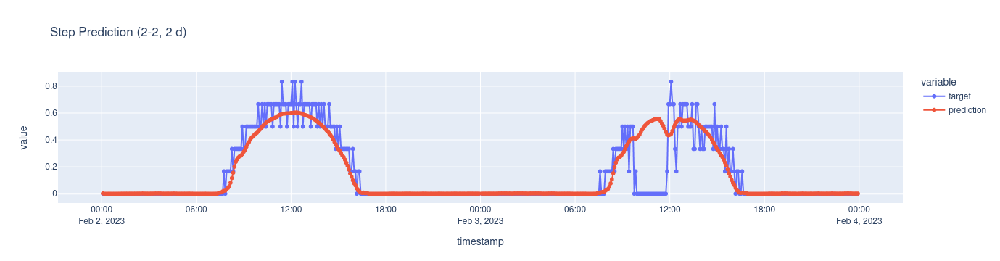

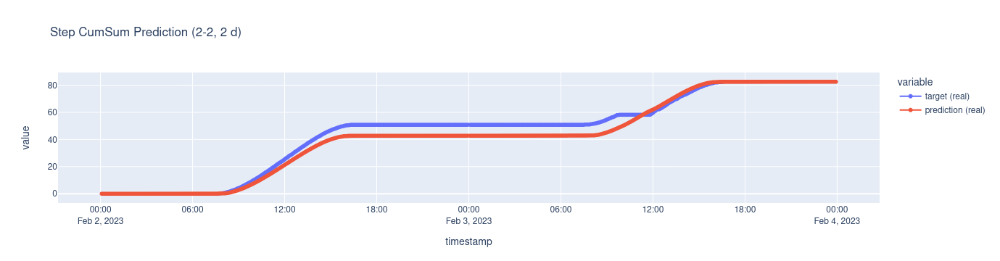

MAPE(+) (2-2): 0.301
SMAPE   (2-2): 1.403
NRMSE   (2-2): 0.152
MAE     (2-2): 0.056
MIE     (2-2): 0.056
R2      (2-2): 0.713
MAE (real): 4.0603413581848145


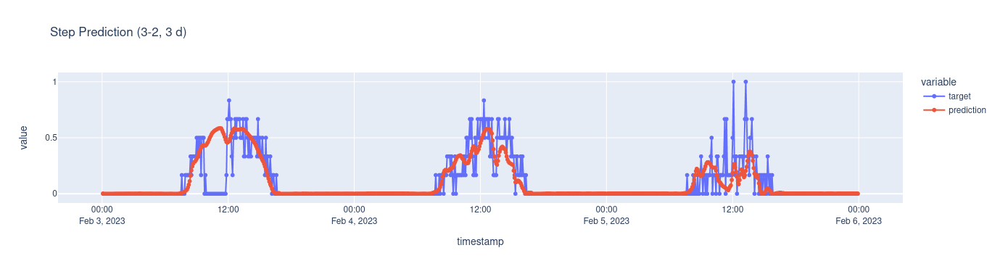

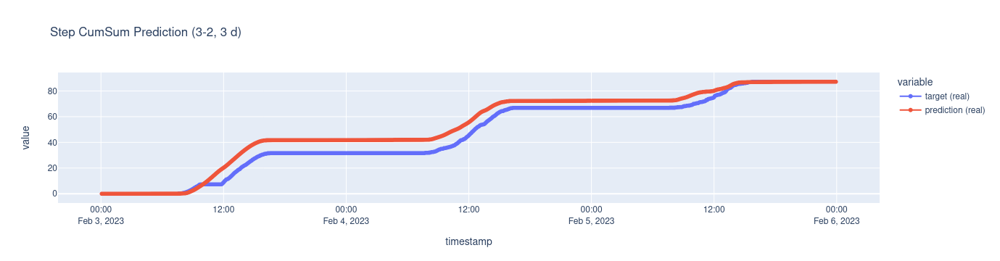

MAPE(+) (3-2): 0.460
SMAPE   (3-2): 1.547
NRMSE   (3-2): 0.134
MAE     (3-2): 0.060
MIE     (3-2): 0.060
R2      (3-2): 0.504
MAE (real): 5.885753631591797


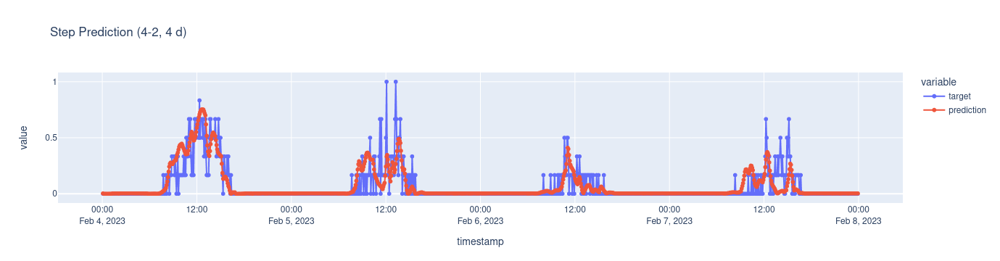

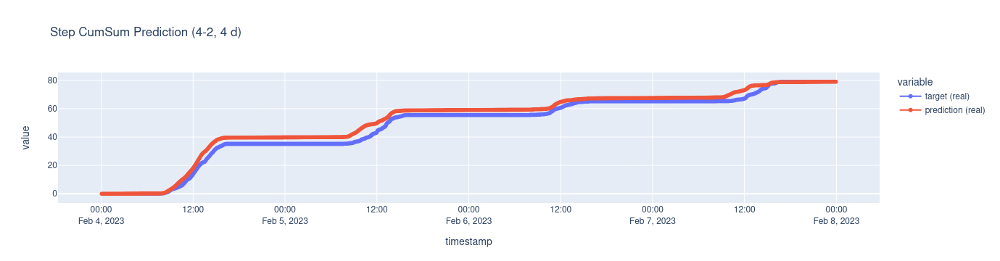

MAPE(+) (4-2): 0.565
SMAPE   (4-2): 1.679
NRMSE   (4-2): 0.0981
MAE     (4-2): 0.045
MIE     (4-2): 0.045
R2      (4-2): 0.575
MAE (real): 3.179901123046875


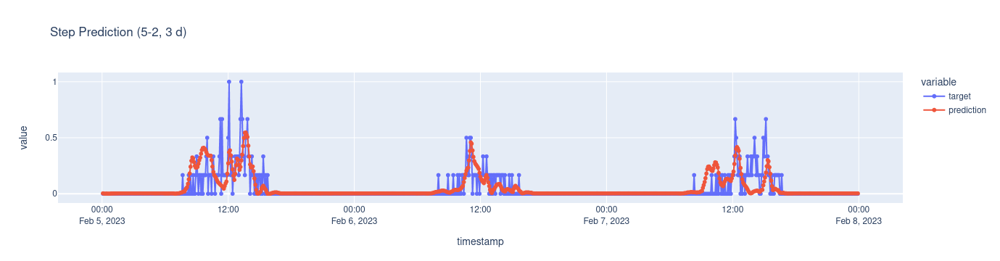

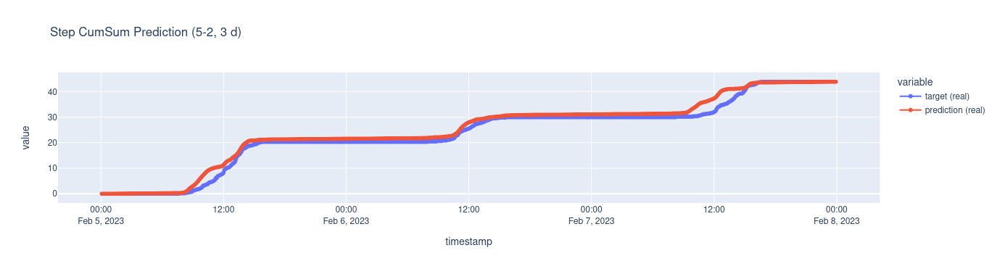

MAPE(+) (5-2): 0.585
SMAPE   (5-2): 1.744
NRMSE   (5-2): 0.0975
MAE     (5-2): 0.044
MIE     (5-2): 0.044
R2      (5-2): 0.360
MAE (real): 1.3071191310882568


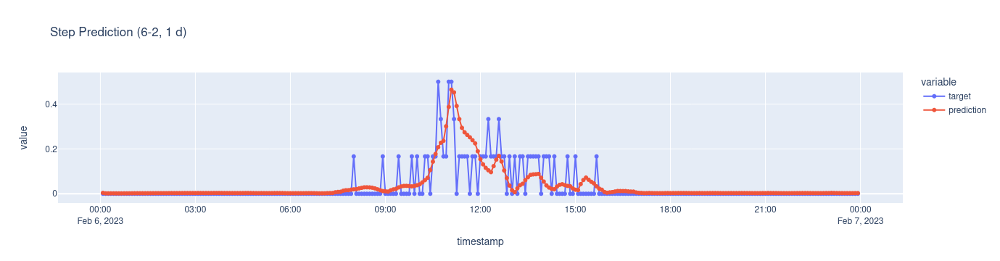

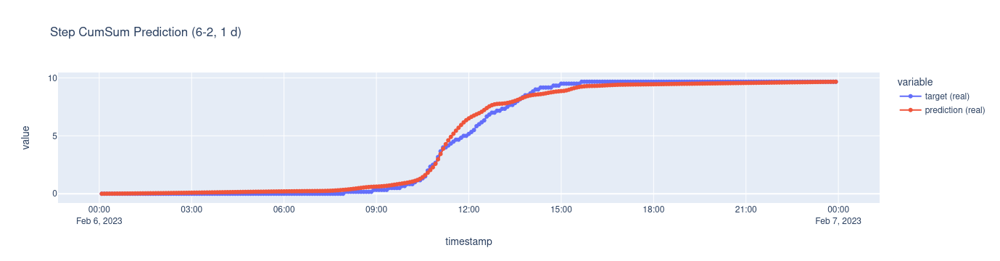

MAPE(+) (6-2): 0.554
SMAPE   (6-2): 1.795
NRMSE   (6-2): 0.118
MAE     (6-2): 0.028
MIE     (6-2): 0.028
R2      (6-2): 0.502
MAE (real): 0.23862653970718384


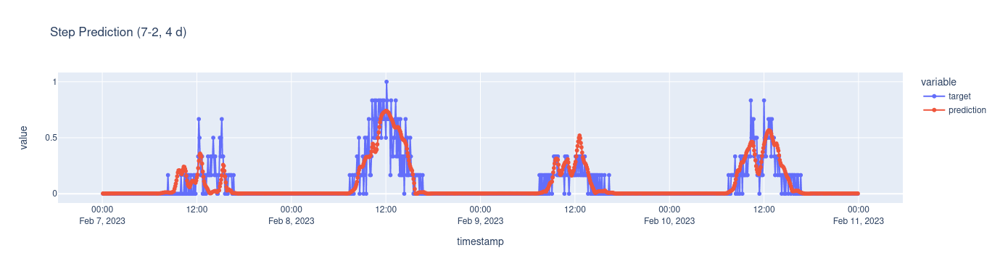

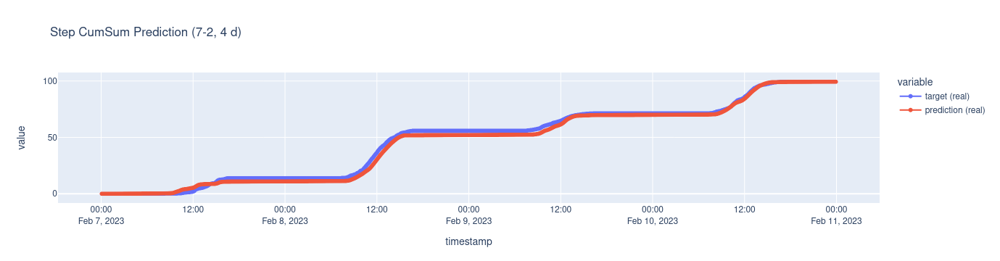

MAPE(+) (7-2): 0.523
SMAPE   (7-2): 1.617
NRMSE   (7-2): 0.0944
MAE     (7-2): 0.046
MIE     (7-2): 0.046
R2      (7-2): 0.703
MAE (real): 2.1508305072784424


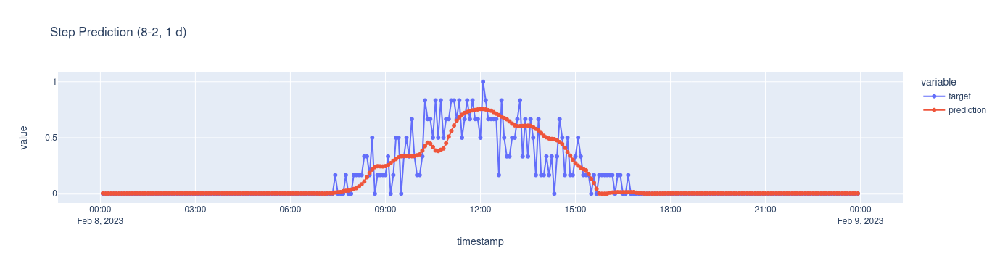

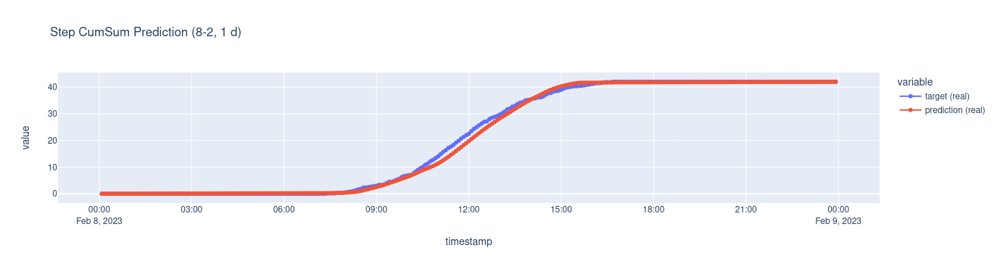

MAPE(+) (8-2): 0.542
SMAPE   (8-2): 1.510
NRMSE   (8-2): 0.12
MAE     (8-2): 0.062
MIE     (8-2): 0.062
R2      (8-2): 0.767
MAE (real): 0.5325168967247009


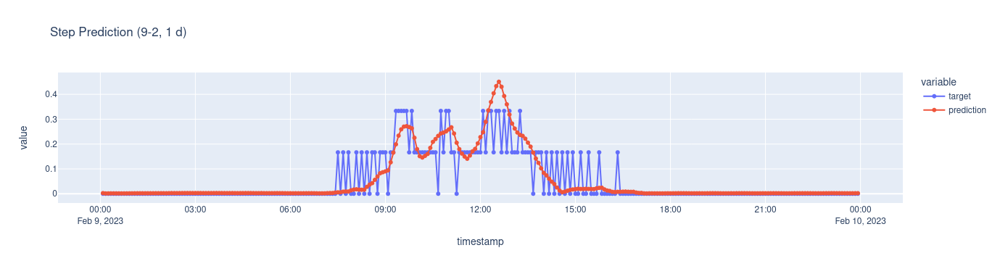

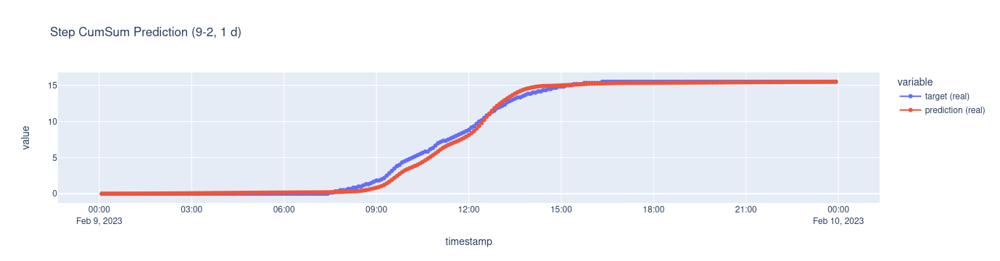

MAPE(+) (9-2): 0.449
SMAPE   (9-2): 1.624
NRMSE   (9-2): 0.171
MAE     (9-2): 0.028
MIE     (9-2): 0.028
R2      (9-2): 0.653
MAE (real): 0.2986609637737274


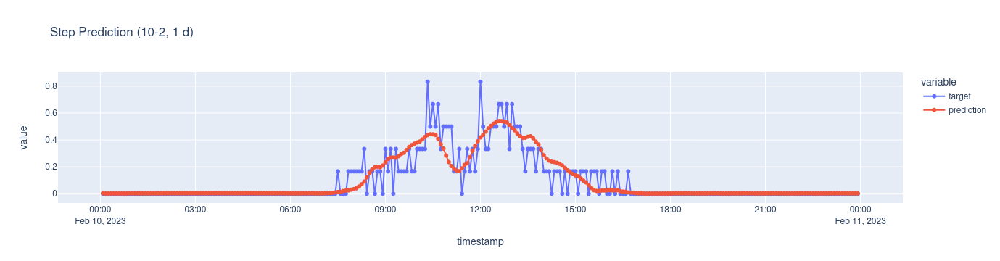

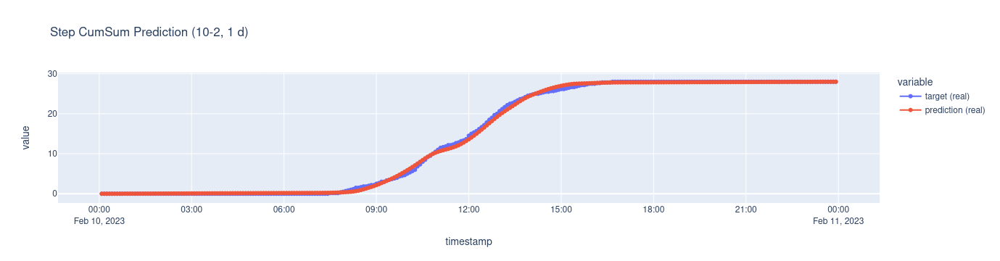

MAPE(+) (10-2): 0.437
SMAPE   (10-2): 1.526
NRMSE   (10-2): 0.101
MAE     (10-2): 0.043
MIE     (10-2): 0.043
R2      (10-2): 0.763
MAE (real): 0.2625816762447357


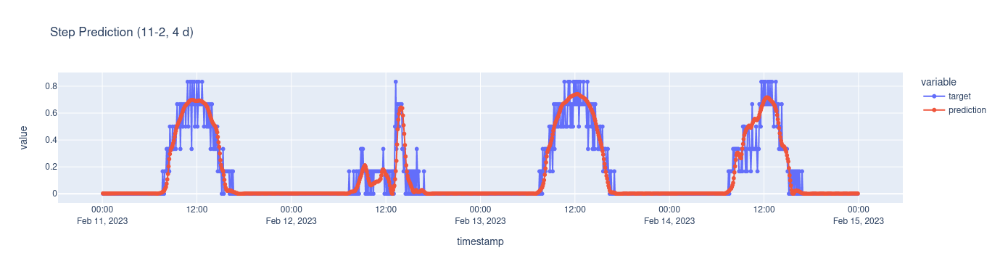

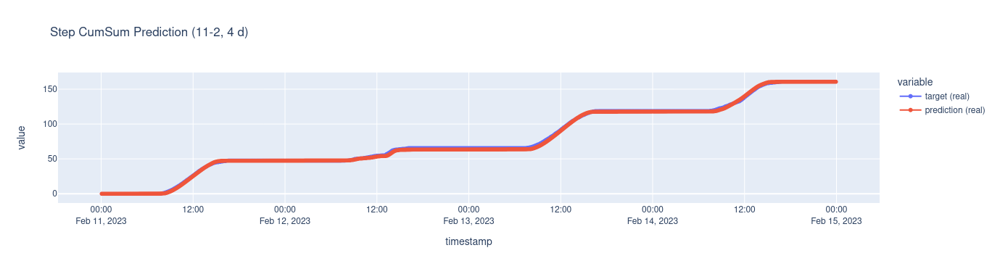

MAPE(+) (11-2): 0.370
SMAPE   (11-2): 1.459
NRMSE   (11-2): 0.0959
MAE     (11-2): 0.040
MIE     (11-2): 0.040
R2      (11-2): 0.884
MAE (real): 0.8435818552970886


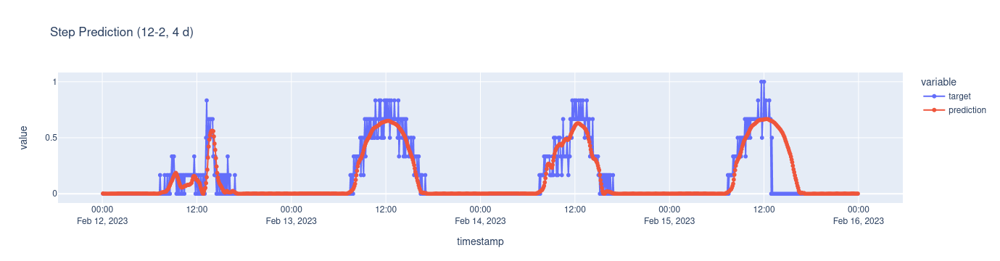

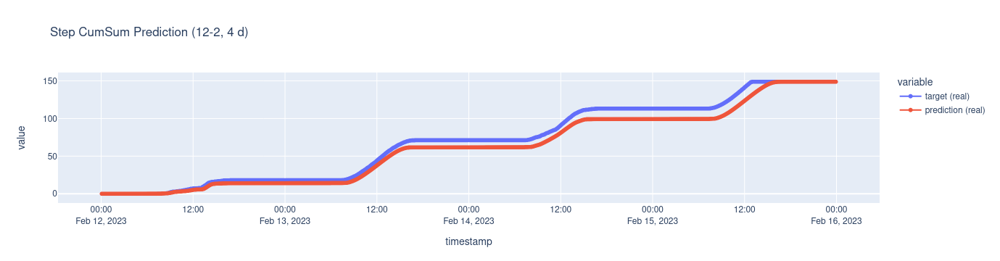

MAPE(+) (12-2): 0.356
SMAPE   (12-2): 1.502
NRMSE   (12-2): 0.118
MAE     (12-2): 0.052
MIE     (12-2): 0.052
R2      (12-2): 0.743
MAE (real): 7.26224946975708


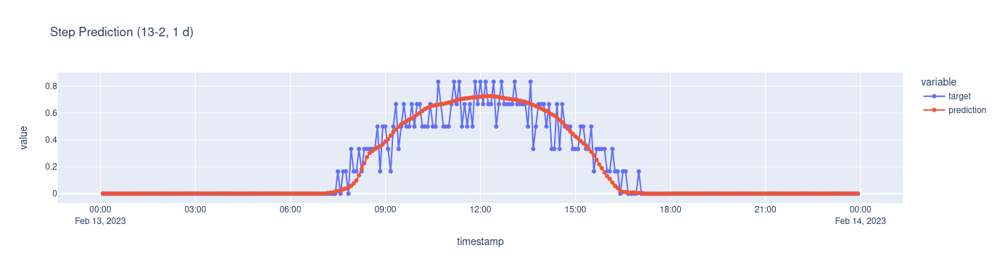

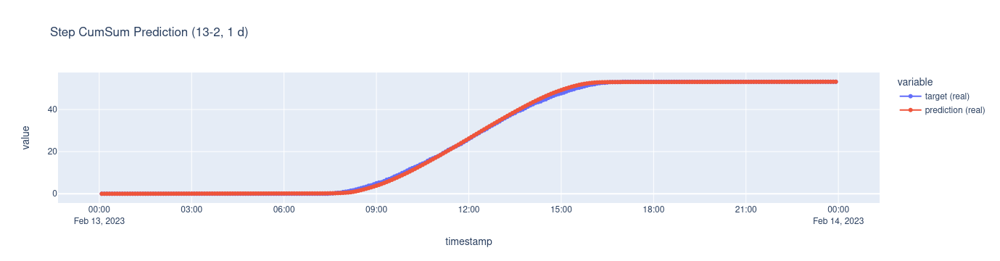

MAPE(+) (13-2): 0.297
SMAPE   (13-2): 1.326
NRMSE   (13-2): 0.0947
MAE     (13-2): 0.042
MIE     (13-2): 0.042
R2      (13-2): 0.914
MAE (real): 0.3236756920814514


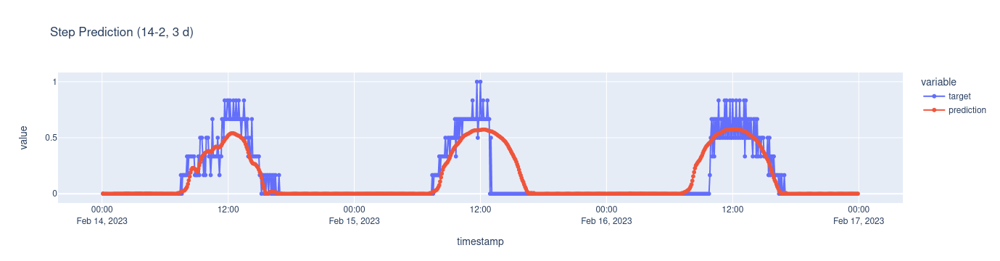

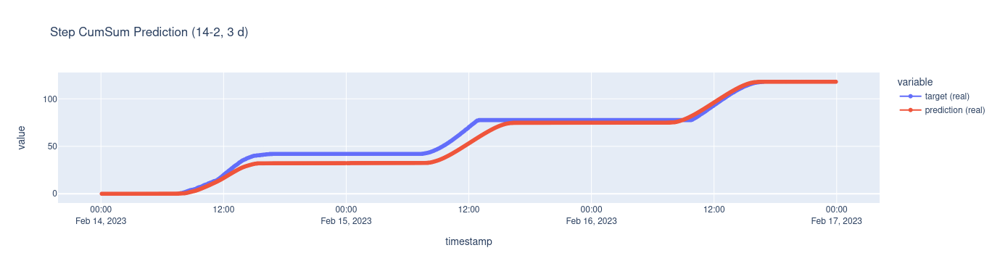

MAPE(+) (14-2): 0.341
SMAPE   (14-2): 1.503
NRMSE   (14-2): 0.132
MAE     (14-2): 0.065
MIE     (14-2): 0.065
R2      (14-2): 0.704
MAE (real): 4.957030296325684


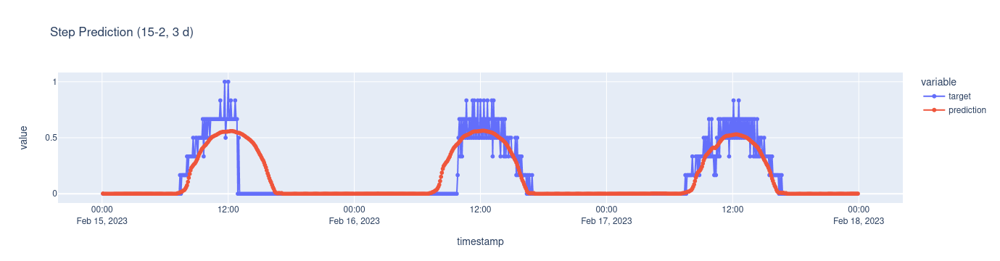

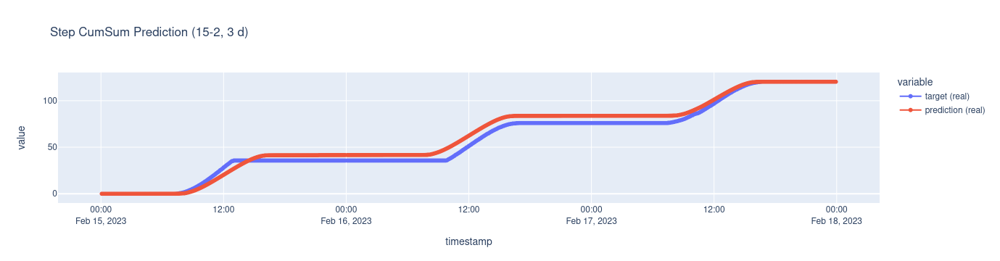

MAPE(+) (15-2): 0.317
SMAPE   (15-2): 1.465
NRMSE   (15-2): 0.128
MAE     (15-2): 0.063
MIE     (15-2): 0.063
R2      (15-2): 0.717
MAE (real): 5.092808723449707


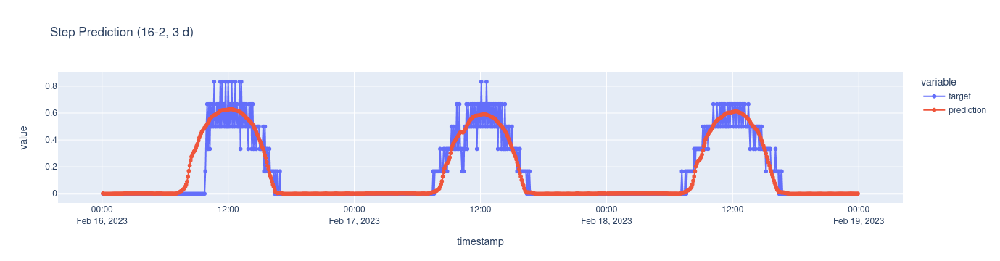

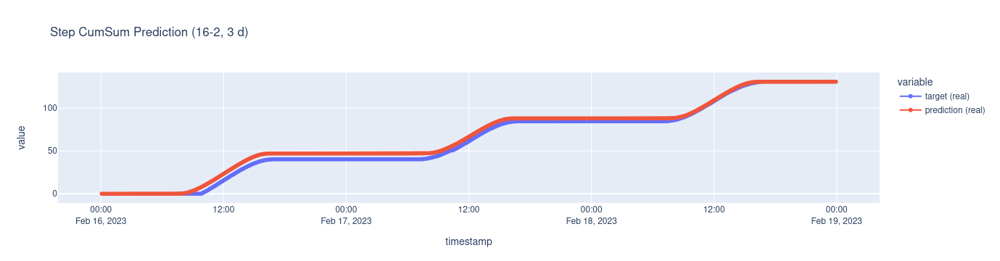

MAPE(+) (16-2): 0.310
SMAPE   (16-2): 1.380
NRMSE   (16-2): 0.108
MAE     (16-2): 0.045
MIE     (16-2): 0.045
R2      (16-2): 0.855
MAE (real): 3.7209157943725586


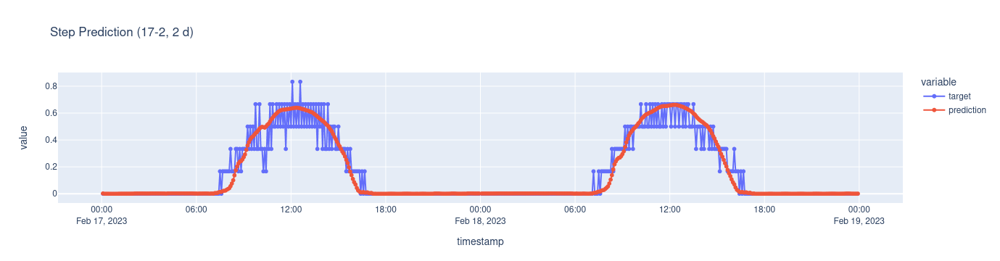

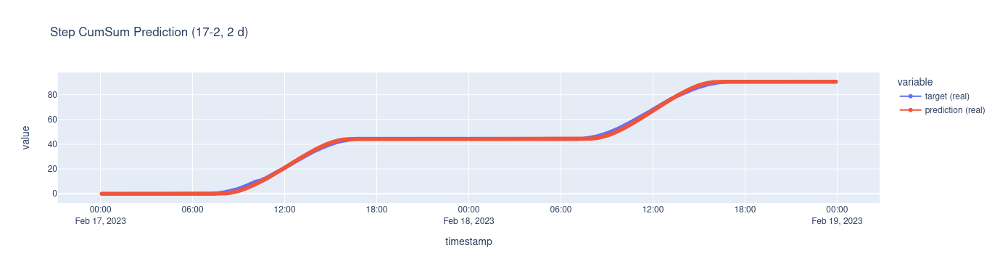

MAPE(+) (17-2): 0.319
SMAPE   (17-2): 1.337
NRMSE   (17-2): 0.0859
MAE     (17-2): 0.038
MIE     (17-2): 0.038
R2      (17-2): 0.903
MAE (real): 0.39397144317626953


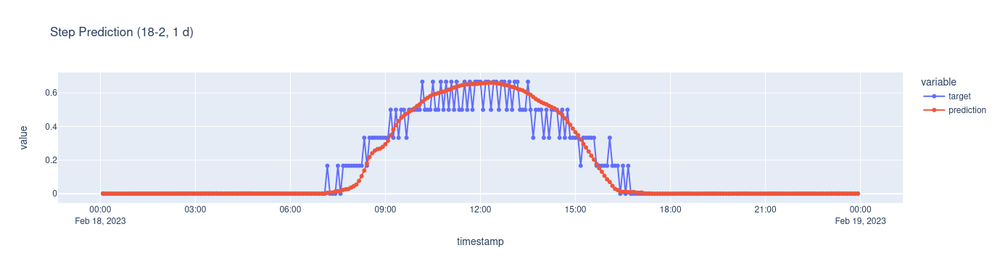

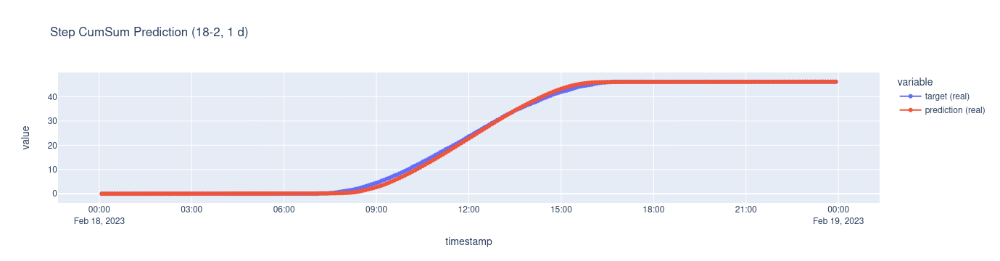

MAPE(+) (18-2): 0.274
SMAPE   (18-2): 1.325
NRMSE   (18-2): 0.094
MAE     (18-2): 0.033
MIE     (18-2): 0.033
R2      (18-2): 0.926
MAE (real): 0.42154958844184875


MAPE(+) (19-2): 0.376
SMAPE   (19-2): 1.392
NRMSE   (19-2): 0.0944
MAE     (19-2): 0.038
MIE     (19-2): 0.038
R2      (19-2): 0.859
MAE (real): 0.6272844672203064


MAPE(+) (20-2): 0.367
SMAPE   (20-2): 1.355
NRMSE   (20-2): 0.0925
MAE     (20-2): 0.038
MIE     (20-2): 0.038
R2      (20-2): 0.867
MAE (real): 3.5570766925811768


MAPE(+) (21-2): 0.250
SMAPE   (21-2): 1.255
NRMSE   (21-2): 0.095
MAE     (21-2): 0.032
MIE     (21-2): 0.032
R2      (21-2): 0.930
MAE (real): 0.4503466784954071


MAPE(+) (22-2): 0.394
SMAPE   (22-2): 1.359
NRMSE   (22-2): 0.12
MAE     (22-2): 0.037
MIE     (22-2): 0.037
R2      (22-2): 0.855
MAE (real): 2.0886712074279785


MAPE(+) (23-2): 0.428
SMAPE   (23-2): 1.349
NRMSE   (23-2): 0.129
MAE     (23-2): 0.040
MIE     (23-2): 0.040
R2      (23-2): 0.856
MAE (real): 0.522186815738678


UsageError: Run (e1qt4efb) is finished. The call to `log` will be ignored. Please make sure that you are using an active run.

In [38]:
test_dataset = CustomDataset(test_df, 1)
test_dataloader = DataLoader(
    test_dataset,
    batch_size=1,
    collate_fn=collate_fn,
    shuffle=False
)

result = pd.DataFrame()
mean_abs_percentage_error = MeanAbsolutePercentageError()
smape = SymmetricMeanAbsolutePercentageError()
r2 = R2Score()
mae = MeanAbsoluteError()
mie = MeanImputationError
nrmse = NormalizedRootMeanSquareError
mape_points = []
smape_points = []
mae_points = []
r2_points = []
mape = 0

# Create a table
table = wandb.Table(columns = ["Evaluation (on Testing Set)", "MAPE(+)", "SMAPE", "NRMSE", "MAE", "MIE", "R2"])

# Create path for Plotly figure
path_to_plotly_html = "./plotly_figure.html"

for i, (vbefore, vtarget, vfuture, vafter, vm_b, vm_t, vm_a, timestamps) in enumerate(test_dataloader):
    timestamp =  pd.to_datetime(pd.Series(timestamps[0]))
    timestamp = timestamp[vm_t[0] == 1]
    
    vbefore, vafter, vfuture = vbefore.to(device), vafter.to(device), vfuture.to(device)
    prediction = model(vbefore, vafter, vfuture)
    
    prediction = prediction.cpu().detach()    
    
    # print(((prediction/prediction.sum(dim=0, keepdim=True)) * vtarget.sum(dim=0, keepdim=True)))
    # print(((prediction/prediction.sum(dim=0, keepdim=False)) * vtarget.sum(dim=0, keepdim=False)))

    prediction = (prediction/prediction.sum(dim=(1,2), keepdim=True)) * vtarget.sum(dim=(1,2), keepdim=True)
    #prediction = (prediction/prediction.sum()) * vtarget.sum()
    # tutto quello che è < 0 diventa 0
    prediction[prediction < 0] = 0 # Posso farlo all'interno del modello ??
    
    #print(vtarget.shape, vtarget.sum(dim=(1,2)).shape, vtarget.sum(dim=(1,2), keepdim=True).shape, vtarget.sum().shape)
    #print(vtarget.sum())
    #step_mape = mean_abs_percentage_error(target=vtarget, preds=prediction).item()
    step_mape_positives = mean_abs_percentage_error(target=vtarget[vtarget>0], preds=prediction[vtarget>0])
    
    step_smape = smape(target=vtarget, preds=prediction)
    step_mae = mae(target=vtarget, preds=prediction)
    step_r2 = r2(target=vtarget.squeeze(0), preds=prediction.squeeze(0))
    step_mie = mie(target=vtarget, preds=prediction)
    step_nrmse = nrmse(target=vtarget, preds=prediction)

    #vtarget = vtarget.numpy().reshape(vtarget.shape[1], 1)
    #prediction = prediction.numpy().reshape(prediction.shape[1],1)
    #step_mape_sklearn = mean_absolute_percentage_error(vtarget[vtarget>0], prediction[vtarget>0])
    
    mape_points.append(step_mape_positives)
    mape += step_mape_positives
    
    #print((abs(prediction-vtarget)/len(vtarget) * 100).sum())
    #print((abs(prediction-vtarget)/len(vtarget) * 100).sum())
    
    vtarget = pd.DataFrame(vtarget.numpy().reshape(vtarget.shape[1], 1))
    #vtarget = pd.DataFrame(vtarget)
    vtarget.columns = ['target']
    unnormalized_target = pd.DataFrame((train_target_scaler.inverse_transform(vtarget)).cumsum())
    unnormalized_target.columns = ['target (real)']
    
    prediction = pd.DataFrame(prediction.numpy().reshape(prediction.shape[1],1))    
    #prediction = pd.DataFrame(prediction)
    prediction.columns = ['prediction']
    unnormalized_prediction = pd.DataFrame((train_target_scaler.inverse_transform(prediction)).cumsum())
    unnormalized_prediction.columns = ['prediction (real)']
    
    step_result = pd.concat([vtarget, prediction], axis=1)
    step_result.index = timestamp
    step_result_real = pd.concat([unnormalized_target, unnormalized_prediction], axis=1)
    step_result_real.index = timestamp
    
    fig = px.line(step_result, y=['target', 'prediction'], title=f"Step Prediction ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}, {int(np.count_nonzero(vm_t[0]==1)/287)} d)", markers=True)
    fig.write_html(path_to_plotly_html, auto_play=False) 
    fig.show()
    
    fig = px.line(step_result_real, y=['target (real)', 'prediction (real)'], title=f"Step CumSum Prediction ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}, {int(np.count_nonzero(vm_t[0]==1)/287)} d)", markers=True)
    fig.show()
    
    table.add_data(wandb.Html(path_to_plotly_html), step_mape_positives, step_smape, step_nrmse, step_mae, step_mie, step_r2)

    result =  pd.concat([result, step_result])
    
    print(f"MAPE(+) ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_mape_positives:.3f}")
    print(f"SMAPE   ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_smape:.3f}")
    print(f"NRMSE   ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_nrmse:.3}")
    print(f"MAE     ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_mae:.3f}")
    print(f"MIE     ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_mie:.3f}")
    print(f"R2      ({timestamp.dt.day.values[0]}-{timestamp.dt.month.values[0]}): {step_r2:.3f}")
    
    print("MAE (real):", mae(target=torch.tensor(step_result_real['target (real)'].values), preds=torch.tensor(step_result_real['prediction (real)'].values)).item())

# print("Mape Global: ", mape/i) # TODO: ricontrollare

# Log Table
run.log({"evluation_table": table})
run.finish()

#### Prove

In [50]:
# METRICA
print(timestamp)
df.loc[timestamp]['Cont_TotalEnergy(kWh)']

# Denormalizza i dati
# minmaxscalerobj.inverse_transofrm(data)

287    2023-02-23 00:05:00
288    2023-02-23 00:10:00
289    2023-02-23 00:15:00
290    2023-02-23 00:20:00
291    2023-02-23 00:25:00
               ...        
1143   2023-02-25 23:35:00
1144   2023-02-25 23:40:00
1145   2023-02-25 23:45:00
1146   2023-02-25 23:50:00
1147   2023-02-25 23:55:00
Name: timestamp, Length: 861, dtype: datetime64[ns]


timestamp
2023-02-23 00:05:00    9719649.0
2023-02-23 00:10:00    9719649.0
2023-02-23 00:15:00    9719649.0
2023-02-23 00:20:00    9719649.0
2023-02-23 00:25:00    9719649.0
                         ...    
2023-02-25 23:35:00    9728532.0
2023-02-25 23:40:00    9728532.0
2023-02-25 23:45:00    9728532.0
2023-02-25 23:50:00    9728532.0
2023-02-25 23:55:00    9728532.0
Name: Cont_TotalEnergy(kWh), Length: 861, dtype: float64

<AxesSubplot:xlabel='timestamp'>

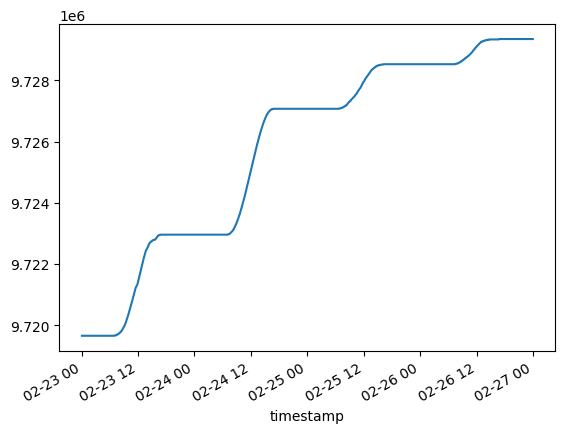

In [23]:
df.loc[timestamp]['Cont_TotalEnergy(kWh)'].plot()


<AxesSubplot:>

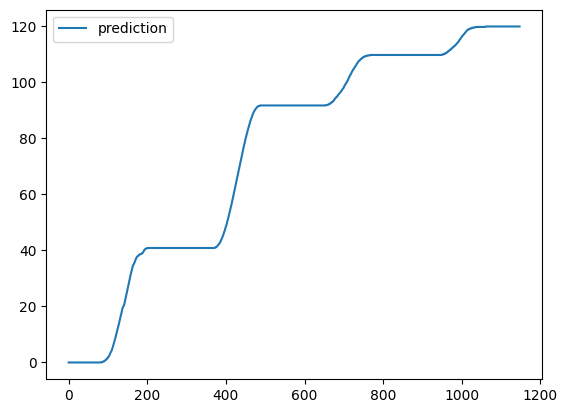

In [28]:
prediction.cumsum().plot()

In [43]:
verita = train_scaler.transform(df.loc[timestamp])
verita = pd.DataFrame(verita, index=timestamp, columns=df.columns)
verita = verita['Cont_TotalEnergy(kWh)']
#verita = verita['Cont_TotalEnergy(kWh)'].values

In [46]:
cumsums = pd.DataFrame(df.loc[timestamp]['Cont_TotalEnergy(kWh)'].values)
cumsums = pd.concat([cumsums, train_scaler.inverse_transform(prediction).cumsum()], axis=1)
cumsums.columns = ['target', 'prediction']
cumsums.set_index = timestamp
cumsums

ValueError: non-broadcastable output operand with shape (1148,1) doesn't match the broadcast shape (1148,47)

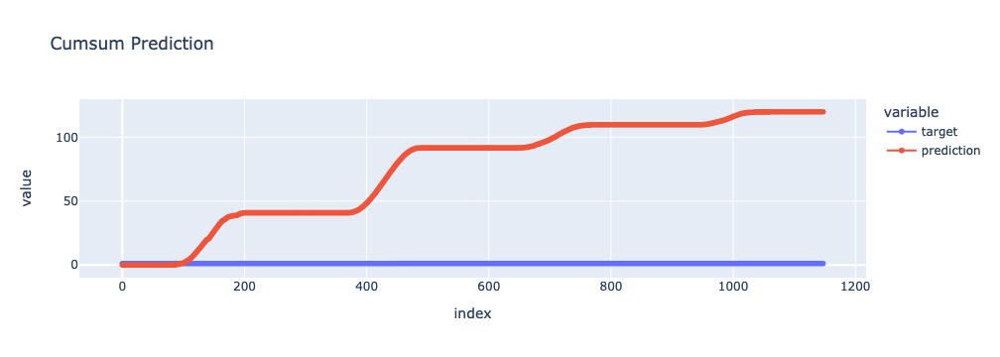

In [32]:
fig = px.line(cumsums, y=['target', 'prediction'], title=f"Cumsum Prediction", markers=True)
fig.show()